In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
import seaborn as sns
import torch
from torch import nn

pd.set_option('display.max_columns', None)    # 显示所有列
pd.set_option('display.max_rows', None)      # 显示所有行
#中文设置
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']

In [2]:
#查询空值
def search_null_values(data):
    print("各列是否包含空值:")
    print(data.isnull().any())
    print("各列包含空值数:")
    print(data.isnull().sum(axis=0))
    # 顶多有 null_number 行是空值
    null_number = sum(data.isnull().sum(axis=0))
    # 把所有空值的行显示出来
    print("所有包含空值的行:")
    print(data[data.isnull().T.any()].head(null_number))
    
def nan_get_number(data,data_label, n):
    data[data_label][n] = (data[data_label][n+1]+data[data_label][n-1])/2
    return data

#将时间变为年月日时分秒列
def time_connvert(data,columns):
    data[columns] = pd.to_datetime(data[columns], format='%Y-%m-%d')
    data[columns+'_year'] = data[columns].dt.year
    data[columns+'_month'] = data[columns].dt.month
    data[columns+'_day'] = data[columns].dt.day

In [3]:
BCHAIN_MKPRU = pd.read_csv('/Users/jiangshihua/Desktop/2022_Problem_C_DATA/BCHAIN-MKPRU.csv')
LBMA_GOLD = pd.read_csv('/Users/jiangshihua/Desktop/2022_Problem_C_DATA/LBMA-GOLD.csv')

In [4]:
nan_get_number(LBMA_GOLD, 'USD (PM)',74)
nan_get_number(LBMA_GOLD, 'USD (PM)',77)
nan_get_number(LBMA_GOLD, 'USD (PM)',326)
nan_get_number(LBMA_GOLD, 'USD (PM)',329)
nan_get_number(LBMA_GOLD, 'USD (PM)',579)
nan_get_number(LBMA_GOLD, 'USD (PM)',582)
nan_get_number(LBMA_GOLD, 'USD (PM)',832)
nan_get_number(LBMA_GOLD, 'USD (PM)',835)
nan_get_number(LBMA_GOLD, 'USD (PM)',1086)
nan_get_number(LBMA_GOLD, 'USD (PM)',1089)

/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/693344239.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[data_label][n] = (data[data_label][n+1]+data[data_label][n-1])/2


,Date,USD (PM)
0,9/12/16,1324.600
1,9/13/16,1323.650
2,9/14/16,1321.750
3,9/15/16,1310.800
4,9/16/16,1308.350
5,9/19/16,1314.850
6,9/20/16,1313.800
7,9/21/16,1326.100
8,9/22/16,1339.100
9,9/23/16,1338.650


In [5]:
#今天>昨天=1,今天<昨天=-1,今天=昨天=0
BCHAIN_MKPRU['roi'] = None
for i in range(len(BCHAIN_MKPRU['Value'])-1):
    if BCHAIN_MKPRU['Value'][i+1] > BCHAIN_MKPRU['Value'][i]:
        BCHAIN_MKPRU['roi'][i+1] = 1
    elif BCHAIN_MKPRU['Value'][i+1] < BCHAIN_MKPRU['Value'][i]:
        BCHAIN_MKPRU['roi'][i+1] = -1
    elif BCHAIN_MKPRU['Value'][i+1] == BCHAIN_MKPRU['Value'][i]:
        BCHAIN_MKPRU['roi'][i+1] = 0
#     elif i == 1825:
#         break
LBMA_GOLD['roi'] = None
for i in range(len(LBMA_GOLD['USD (PM)'])-1):
    if LBMA_GOLD['USD (PM)'][i+1] > LBMA_GOLD['USD (PM)'][i]:
        LBMA_GOLD['roi'][i+1] = 1
    elif LBMA_GOLD['USD (PM)'][i+1] < LBMA_GOLD['USD (PM)'][i]:
        LBMA_GOLD['roi'][i+1] = -1
    elif LBMA_GOLD['USD (PM)'][i+1] == LBMA_GOLD['USD (PM)'][i]:
        LBMA_GOLD['roi'][i+1] = 0

#今天-昨天
BCHAIN_MKPRU['roi_Value'] = None
for i in range(len(BCHAIN_MKPRU['Value'])-1):
    BCHAIN_MKPRU['roi_Value'][i+1] = BCHAIN_MKPRU['Value'][i+1] - BCHAIN_MKPRU['Value'][i]
LBMA_GOLD['roi_Value'] = None
for i in range(len(LBMA_GOLD['USD (PM)'])-1):
    LBMA_GOLD['roi_Value'][i+1] = LBMA_GOLD['USD (PM)'][i+1]-LBMA_GOLD['USD (PM)'][i]
    
#(今天-昨天)/昨天
BCHAIN_MKPRU['roi_Value_percent'] = None
for i in range(len(BCHAIN_MKPRU['Value'])-1):
    BCHAIN_MKPRU['roi_Value_percent'][i+1] = (BCHAIN_MKPRU['Value'][i+1] - BCHAIN_MKPRU['Value'][i])/BCHAIN_MKPRU['Value'][i]*100
LBMA_GOLD['roi_Value_percent'] = None
for i in range(len(LBMA_GOLD['USD (PM)'])-1):
    LBMA_GOLD['roi_Value_percent'][i+1] = (LBMA_GOLD['USD (PM)'][i+1]-LBMA_GOLD['USD (PM)'][i])/LBMA_GOLD['USD (PM)'][i]*100

/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/1428541212.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BCHAIN_MKPRU['roi'][i+1] = -1
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/1428541212.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BCHAIN_MKPRU['roi'][i+1] = 1
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/1428541212.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-cop

In [9]:
#生成时间列
#补全时间
for i in range(len(BCHAIN_MKPRU)):
    BCHAIN_MKPRU['Date'][i] = BCHAIN_MKPRU['Date'][i][:-2] +'20'+ BCHAIN_MKPRU['Date'][i][-2:]
for i in range(len(LBMA_GOLD)):
    LBMA_GOLD['Date'][i] = LBMA_GOLD['Date'][i][:-2] +'20'+ LBMA_GOLD['Date'][i][-2:]
    
for i in range(len(BCHAIN_MKPRU)):
    BCHAIN_MKPRU['Date'][i] = BCHAIN_MKPRU['Date'][i].replace('/','-')
for i in range(len(LBMA_GOLD)):
    LBMA_GOLD['Date'][i] = LBMA_GOLD['Date'][i].replace('/','-')    
for i in range(len(BCHAIN_MKPRU)):
    BCHAIN_MKPRU['Date'][i] = datetime.strptime(BCHAIN_MKPRU['Date'][i], '%m-%d-%Y')
for i in range(len(LBMA_GOLD)):
    LBMA_GOLD['Date'][i] = datetime.strptime(LBMA_GOLD['Date'][i], '%m-%d-%Y')
    
time_connvert(BCHAIN_MKPRU, 'Date')
time_connvert(LBMA_GOLD, 'Date')

/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/469016152.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BCHAIN_MKPRU['Date'][i] = BCHAIN_MKPRU['Date'][i][:-2] +'20'+ BCHAIN_MKPRU['Date'][i][-2:]
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/469016152.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LBMA_GOLD['Date'][i] = LBMA_GOLD['Date'][i][:-2] +'20'+ LBMA_GOLD['Date'][i][-2:]
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/469016152.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the doc

In [10]:
#每月价格均值
BCHAIN_MKPRU_mean_Value = BCHAIN_MKPRU.groupby(["Date_year","Date_month"])["Value"].agg(["mean"])
BCHAIN_MKPRU_mean_Value.columns = ["month_mean_Value"]
BCHAIN_MKPRU_mean_Value.reset_index(inplace=True)
#print(BCHAIN_MKPRU_mean_Value)
LBMA_GOLD_mean_Value = LBMA_GOLD.groupby(["Date_year","Date_month"])["USD (PM)"].agg(["mean"])
LBMA_GOLD_mean_Value.columns = ["month_mean_Value"]
LBMA_GOLD_mean_Value.reset_index(inplace=True)
#print(LBMA_GOLD_mean_Value)

#合并表格
BCHAIN_MKPRU = pd.merge(BCHAIN_MKPRU, BCHAIN_MKPRU_mean_Value, on=['Date_year','Date_month'])
LBMA_GOLD = pd.merge(LBMA_GOLD, LBMA_GOLD_mean_Value, on=['Date_year','Date_month'])

In [11]:
#月份roi
BCHAIN_MKPRU['month_roi'] = None
for i in range(len(BCHAIN_MKPRU['Value'])):
    if BCHAIN_MKPRU['Value'][i] > BCHAIN_MKPRU['month_mean_Value'][i]:
        BCHAIN_MKPRU['month_roi'][i] = 1
    elif BCHAIN_MKPRU['Value'][i] < BCHAIN_MKPRU['month_mean_Value'][i]:
        BCHAIN_MKPRU['month_roi'][i] = -1
    elif BCHAIN_MKPRU['Value'][i] == BCHAIN_MKPRU['month_mean_Value'][i]:
        BCHAIN_MKPRU['month_roi'][i] = 0
        
#月份roi
LBMA_GOLD['month_roi'] = None
for i in range(len(LBMA_GOLD['USD (PM)'])):
    if LBMA_GOLD['USD (PM)'][i] > LBMA_GOLD['month_mean_Value'][i]:
        LBMA_GOLD['month_roi'][i] = 1
    elif LBMA_GOLD['USD (PM)'][i] < LBMA_GOLD['month_mean_Value'][i]:
        LBMA_GOLD['month_roi'][i] = -1
    elif LBMA_GOLD['USD (PM)'][i] == LBMA_GOLD['month_mean_Value'][i]:
        LBMA_GOLD['month_roi'][i] = 0

/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/2620297128.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BCHAIN_MKPRU['month_roi'][i] = 1
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/2620297128.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BCHAIN_MKPRU['month_roi'][i] = -1
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_85167/2620297128.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

In [12]:
BCHAIN_MKPRU_mean_Value['year_month'] = None
BCHAIN_MKPRU_mean_Value['year_month']=BCHAIN_MKPRU_mean_Value.apply(lambda x:str(x['Date_year'])+"-"+str(x['Date_month']),axis=1)
BCHAIN_MKPRU_mean_Value = BCHAIN_MKPRU_mean_Value.set_index('year_month')

In [27]:
LBMA_GOLD_mean_Value['year_month'] = None
LBMA_GOLD_mean_Value['year_month']=LBMA_GOLD_mean_Value.apply(lambda x:str(x['Date_year'])+"-"+str(x['Date_month']),axis=1)
LBMA_GOLD_mean_Value = LBMA_GOLD_mean_Value.set_index('year_month')

Text(0.5, 0, 'time')

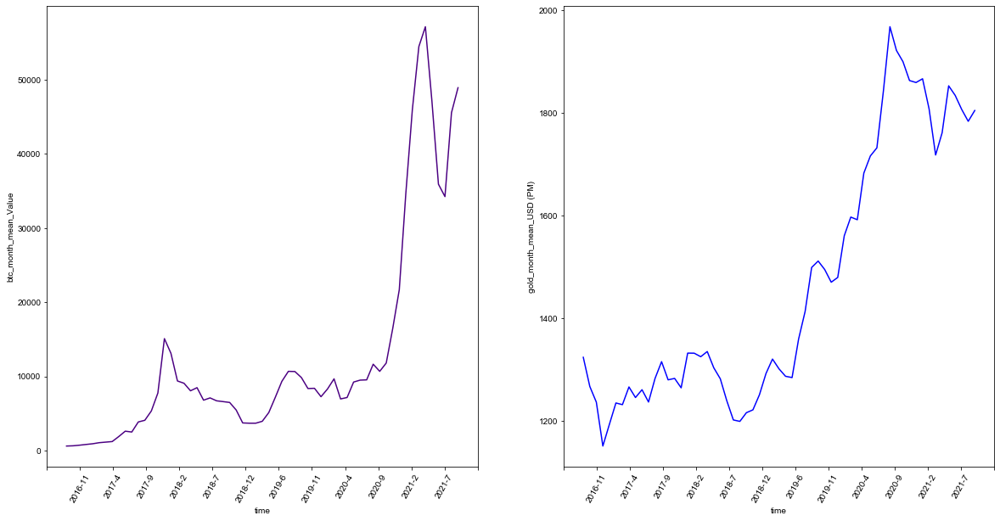

In [53]:
#每月平均价格折线图
#BCHAIN_MKPRU_mean_Value = BCHAIN_MKPRU_mean_Value.reset_index()
#LBMA_GOLD_mean_Value = LBMA_GOLD_mean_Value.reset_index()
# sns.relplot(data=BCHAIN_MKPRU_mean_Value,x=BCHAIN_MKPRU_mean_Value.index,y=BCHAIN_MKPRU_mean_Value['month_mean_Value'],kind="line")
# sns.relplot(data=LBMA_GOLD_mean_Value,x=LBMA_GOLD_mean_Value.index,y="gold_month_mean_Value",kind="line")
# del BCHAIN_MKPRU_mean_Value['index']
# del LBMA_GOLD_mean_Value['index']

from matplotlib import pyplot as plt
import matplotlib as mpl
%matplotlib inline
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
### 代码开始 ### (≈ 9 行代码)
axes[0].plot(BCHAIN_MKPRU_mean_Value.index,BCHAIN_MKPRU_mean_Value['month_mean_Value'], color='indigo')
#axes[0].grid()
# 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[0].xaxis.set_major_locator(xlocator)
for tick in axes[0].get_xticklabels():
    tick.set_rotation(60)
axes[0].set_ylabel('btc_month_mean_Value')
axes[0].set_xlabel('time')
# axes[0].patch.set_facecolor("lightpink")            #设置ax1区域背景颜色               
# axes[0].patch.set_alpha(0.5)                      #设置ax1区域背景颜色透明度       

axes[1].plot(LBMA_GOLD_mean_Value.index,LBMA_GOLD_mean_Value['month_mean_Value'], color='blue')
#axes[1].grid()
# 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[1].xaxis.set_major_locator(xlocator)
for tick in axes[1].get_xticklabels():
    tick.set_rotation(60)
axes[1].set_ylabel('gold_month_mean_USD (PM)')
axes[1].set_xlabel('time')
# axes[1].patch.set_facecolor("lawngreen")            #设置ax1区域背景颜色               
# axes[1].patch.set_alpha(0.5)                      #设置ax1区域背景颜色透明度       

In [26]:
data = pd.merge(BCHAIN_MKPRU, LBMA_GOLD, on='Date',how='left')
del data['Date_year_x']
del data['Date_month_x']
del data['Date_day_x']
del data['Date_year_y']
del data['Date_month_y']
del data['Date_day_y']

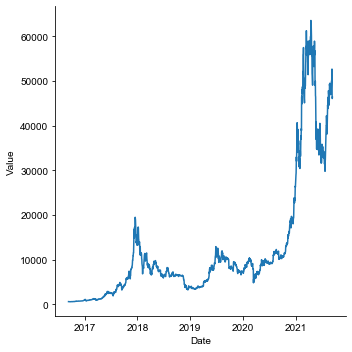

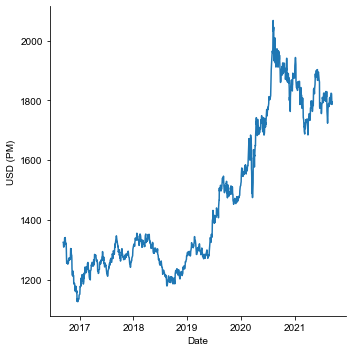

In [27]:
#每天价格
sns.relplot(data=data,x="Date",y="Value",kind="line")
sns.relplot(data=data,x="Date",y="USD (PM)",kind="line")

In [28]:
data['have_money'] = None
data['deal_bitcoin'] = None
data['deal_gold'] = None
data['have_bitcoin'] = None
data['have_gold'] = None

data['have_money'][0] = 1000
data['deal_bitcoin'][0] = 0
data['deal_gold'][0] = 0
data['have_bitcoin'][0] = 0
data['have_gold'][0] = 0

/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_71553/3586027394.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['have_money'][0] = 1000
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_71553/3586027394.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['deal_bitcoin'][0] = 0
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_71553/3586027394.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [1]:
#%%
import pandas as pd
import numpy as np
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import TensorDataset, DataLoader
import torchkeras
from plotly import graph_objects as go
from sklearn.preprocessing import MinMaxScaler

In [3]:
#交易成本比例
bitcoin_cost = 0.023
gold_cost = 0.013
#风险厌恶系数
fear = 0

In [3]:
data['USD (PM)'].fillna(method='ffill',inplace=True)
data['roi_Value_y'].fillna(0,inplace=True)
data['roi_Value_percent_y'].fillna(0,inplace=True)
data['month_mean_Value_y'].fillna(method='bfill',inplace=True)
data['month_roi_y'].fillna(method='bfill',inplace=True)
data['roi_y'].fillna(0,inplace=True)

NameError: name 'data' is not defined

In [4]:
data['USD (PM)'][0]=1324.6
data['roi_x'][0]=0
data['roi_Value_x'][0]=0
data['roi_Value_percent_x'][0]=0

NameError: name 'data' is not defined

In [4]:
#data.to_csv('/Users/jiangshihua/Desktop/data.csv')
data=pd.read_csv('/Users/jiangshihua/Desktop/data_new.csv')
BCHAIN_MKPRU=pd.read_csv('/Users/jiangshihua/Desktop/BCHAIN_MKPRU.csv')
LBMA_GOLD=pd.read_csv('/Users/jiangshihua/Desktop/LBMA_GOLD.csv')
del data['Unnamed: 0']

In [5]:
#生成新的买卖列
buy_bitcoin_list = []
sale_bitcoin_list = []
buy_gold_list = []
sale_gold_list = []
for i in range(len(data)):
    buy_bitcoin_list.append(data['Value'][i]*(1+bitcoin_cost))
    buy_gold_list.append(data['USD (PM)'][i]*(1+gold_cost))
    sale_bitcoin_list.append(data['Value'][i]*(1-bitcoin_cost))
    sale_gold_list.append(data['USD (PM)'][i]*(1-gold_cost))
    
data['buy_Value'] = None 
data['sale_Value'] = None
data['buy_USD (PM)'] = None 
data['sale_USD (PM)'] = None

data.iloc[:,-4:-3] = buy_bitcoin_list
data.iloc[:,-3:-2] = sale_bitcoin_list
data.iloc[:,-2:-1] = buy_gold_list
data.iloc[:,-1:] = sale_gold_list
#生成new_roi列
aa = np.array(buy_bitcoin_list)
bb = np.array(sale_bitcoin_list)
cc = np.array(buy_gold_list)
dd = np.array(sale_gold_list)

new_bitcoin_list = []
new_gold_list = []
for i in range(1,len(aa)):
    new_bitcoin_list.append(bb[i]-aa[i-1])
    new_gold_list.append(dd[i]-cc[i-1])
new_bitcoin_list.insert(0,0)
new_gold_list.insert(0,0)

data['new_roi_bitcoin'] = None
data['new_roi_gold'] = None
data.iloc[:,-2:-1] = new_bitcoin_list
data.iloc[:,-1:] = new_gold_list
#data.to_csv('/Users/jiangshihua/Desktop/data_new.csv')

In [6]:
cols = list(data)

In [7]:
#bbbb= [,'deal_bitcoin','deal_gold','have_bitcoin','have_gold']
cols.insert(-1,cols.pop(cols.index('have_money')))
cols.insert(-1,cols.pop(cols.index('deal_bitcoin')))
cols.insert(-1,cols.pop(cols.index('deal_gold')))
cols.insert(-1,cols.pop(cols.index('have_bitcoin')))
cols.insert(-1,cols.pop(cols.index('have_gold')))
cols.insert(-4,cols.pop(cols.index('new_roi_gold')))

In [8]:
del data['have_money']
del data['deal_bitcoin']
del data['deal_gold']
del data['have_bitcoin']
del data['have_gold']

data['have_money'] = None
data['deal_bitcoin'] = None
data['deal_gold'] = None
data['have_bitcoin'] = None
data['have_gold'] = None

data['have_money'][0] = 1000
data['deal_bitcoin'][0] = 0
data['deal_gold'][0] = 0
data['have_bitcoin'][0] = 0
data['have_gold'][0] = 0

/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_90258/1804531728.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['have_money'][0] = 1000
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_90258/1804531728.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['deal_bitcoin'][0] = 0
/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_90258/1804531728.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-co

In [9]:
#买卖
buy_bitcoin_list = [0,]
buy_gold_list = [0,]
sale_bitcoin_list = [0,]
sale_gold_list = [0,]
have_bitcoin_list = [0,]
have_gold_list = [0,]
have_money_list = [1000,]
for i in range(1,len(data)):
    #全卖
    if data['new_roi_bitcoin'][i+1] < 0 and data['new_roi_gold'][i+1] < 0:
        #第i天的处理
        buy_bitcoin_list.append(0)
        buy_gold_list.append(0)
        sale_bitcoin_list.append((1-fear)*(-have_bitcoin_list[i-1]-buy_bitcoin_list[i-1]))
        sale_gold_list.append((1-fear)*(-have_gold_list[i-1]-buy_gold_list[i-1]))
        have_bitcoin_list.append(0)
        have_gold_list.append(0)
        have_money_list.append(have_money_list[i-1]+data['sale_Value'][i-1]*(-sale_bitcoin_list[i-1])+data['sale_USD (PM)'][i-1]*(-sale_gold_list[i-1]))
    #比特币全卖买黄金
    elif data['new_roi_bitcoin'][i+1] < 0:
        #第i天的处理
        buy_bitcoin_list.append(0)
        buy_gold_list.append((1-fear)*(have_money_list[i-1]+data['sale_Value'][i-1]*(-sale_bitcoin_list[i-1])+data['sale_USD (PM)'][i-1]*(-sale_gold_list[i-1])+data['sale_Value'][i]*(have_bitcoin_list[i-1]+buy_bitcoin_list[i-1]))/data['buy_USD (PM)'][i])
        sale_bitcoin_list.append((1-fear)*(-have_bitcoin_list[i-1]-buy_bitcoin_list[i-1]))
        sale_gold_list.append(0)
        have_bitcoin_list.append(0)
        have_gold_list.append(have_gold_list[i-1]+buy_gold_list[i-1]-sale_gold_list[i])
        have_money_list.append(0)
    #黄金全卖买比特币
    elif data['new_roi_gold'][i+1] < 0:
        #第i天的处理
        buy_bitcoin_list.append((1-fear)*(have_money_list[i-1]+data['sale_Value'][i-1]*(-sale_bitcoin_list[i-1])+data['sale_USD (PM)'][i-1]*(-sale_gold_list[i-1])+data['sale_USD (PM)'][i]*(have_gold_list[i-1]+buy_gold_list[i-1]))/data['buy_Value'][i])
        buy_gold_list.append(0)
        sale_bitcoin_list.append(0)
        sale_gold_list.append((1-fear)*(-have_gold_list[i-1]-buy_gold_list[i-1]))
        have_bitcoin_list.append(have_bitcoin_list[i-1]+buy_bitcoin_list[i-1]-sale_bitcoin_list[i])
        have_gold_list.append(0)
        have_money_list.append(0)
    #比较利润购买
    elif data['new_roi_bitcoin'][i+1] > data['new_roi_gold'][i+1] > 0:
        #第i天的处理 全买比特币
        buy_bitcoin_list.append((1-fear)*(have_money_list[i-1]+data['sale_Value'][i-1]*(-sale_bitcoin_list[i-1])+data['sale_USD (PM)'][i-1]*(-sale_gold_list[i-1])+data['sale_USD (PM)'][i]*(have_gold_list[i-1]+buy_gold_list[i-1]))/data['buy_Value'][i])
        buy_gold_list.append(0)
        sale_bitcoin_list.append(0)
        sale_gold_list.append((1-fear)*(-have_gold_list[i-1]-buy_gold_list[i-1]))
        have_bitcoin_list.append(have_bitcoin_list[i-1]+buy_bitcoin_list[i-1]-sale_bitcoin_list[i])
        have_gold_list.append(0)
        have_money_list.append(0)
        
    elif data['new_roi_gold'][i+1] > data['new_roi_bitcoin'][i+1] > 0:
        #第i天的处理 全买黄金
        buy_bitcoin_list.append(0)
        buy_gold_list.append((1-fear)*(have_money_list[i-1]+data['sale_Value'][i-1]*(-sale_bitcoin_list[i-1])+data['sale_USD (PM)'][i-1]*(-sale_gold_list[i-1])+data['sale_Value'][i]*(have_bitcoin_list[i-1]+buy_bitcoin_list[i-1]))/data['buy_USD (PM)'][i])
        sale_bitcoin_list.append((1-fear)*(-have_bitcoin_list[i-1]-buy_bitcoin_list[i-1]))
        sale_gold_list.append(0)
        have_bitcoin_list.append(0)
        have_gold_list.append(have_gold_list[i-1]+buy_gold_list[i-1]-sale_gold_list[i])
        have_money_list.append(0)
    if i == 1824:
        break

In [10]:
print('min_have_money_list:',min(have_money_list))
print('max_have_money_list:',max(have_money_list))
print('min_have_bitcoin_list:',min(have_bitcoin_list))
print('max_have_bitcoin_list:',max(have_bitcoin_list))
print('min_have_gold_list:',min(have_gold_list))
print('max_have_gold_list:',max(have_gold_list))
print('min_buy_bitcoin_list:',min(buy_bitcoin_list))
print('max_buy_bitcoin_list:',max(buy_bitcoin_list))
print('min_sale_bitcoin_list:',min(sale_bitcoin_list))
print('max_sale_bitcoin_list:',max(sale_bitcoin_list))
print('min_buy_gold_list:',min(buy_gold_list))
print('max_buy_gold_list:',max(buy_gold_list))
print('min_sale_gold_list:',min(sale_gold_list))
print('max_sale_gold_list:',max(sale_gold_list))

min_have_money_list: 0
max_have_money_list: 7263405.792060942
min_have_bitcoin_list: 0
max_have_bitcoin_list: 178.72616820199178
min_have_gold_list: 0
max_have_gold_list: 0
min_buy_bitcoin_list: 0
max_buy_bitcoin_list: 206.06110662046427
min_sale_bitcoin_list: -206.06110662046427
max_sale_bitcoin_list: 0
min_buy_gold_list: 0
max_buy_gold_list: 369.4660034212769
min_sale_gold_list: -369.4660034212769
max_sale_gold_list: 0


In [11]:
#list对应元素相加
def list_add(a,b):
    c = []
    for i in range(len(a)):
        c.append(a[i]+b[i])
    return c

deal_bitcoin_list = list_add(buy_bitcoin_list, sale_bitcoin_list)
deal_gold_list = list_add(buy_gold_list, sale_gold_list)

In [12]:
data = data.drop(1825, axis=0)
data['have_money'] = None
data['deal_bitcoin'] = None
data['deal_gold'] = None
data['have_bitcoin'] = None
data['have_gold'] = None
data.iloc[:,-5:-4] = have_money_list
data.iloc[:,-4:-3] = deal_bitcoin_list
data.iloc[:,-3:-2] = deal_gold_list
data.iloc[:,-2:-1] = have_bitcoin_list
data.iloc[:,-1:] = have_gold_list

In [12]:
data['all_roi'] = None
all_roi_list = []
for i in range(len(data)):
    if data['new_roi_bitcoin'][i] >0 or data['new_roi_gold'][i]>0:
        all_roi_list.append(1)
    elif data['new_roi_bitcoin'][i] <0 or data['new_roi_gold'][i]<0:
        all_roi_list.append(-1)
    else:
        all_roi_list.append(0)
        
data['all_roi'] = all_roi_list

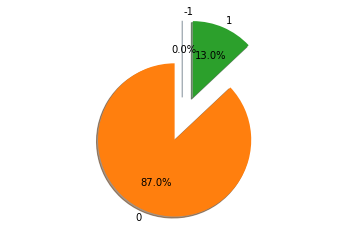

In [30]:
fig, axe = plt.subplots()
labels = '-1', '0', '1'
sizes = [sum(data['all_roi']==-1),sum(data['all_roi']==0),sum(data['all_roi']==1)]
explode = (0.3, 0.1, 0.3)   #控制分隔距离
axe.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
axe.axis('equal')
plt.show()

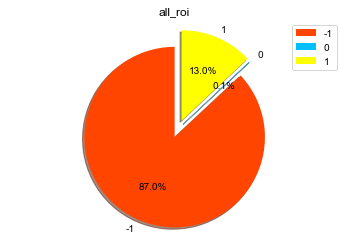

In [70]:
import matplotlib.pyplot as plt
import matplotlib

# matplotlib.rcParams['font.sans-serif'] = ['SimHei']
# matplotlib.rcParams['axes.unicode_minus'] = False

label_list = ["-1", "0", "1"]    # 各部分标签
size = [sum(data['all_roi']==-1),sum(data['all_roi']==0),sum(data['all_roi']==1)]    # 各部分大小
color = ["orangered", "deepskyblue", "yellow"]     # 各部分颜色
explode = [0.1, 0.1, 0.1]   # 各部分突出值

"""
绘制饼图
explode：设置各部分突出
label:设置各部分标签
labeldistance:设置标签文本距圆心位置，1.1表示1.1倍半径
autopct：设置圆里面文本
shadow：设置是否有阴影
startangle：起始角度，默认从0开始逆时针转
pctdistance：设置圆内文本距圆心距离
返回值
l_text：圆内部文本，matplotlib.text.Text object
p_text：圆外部文本
"""

patches, l_text, p_text = plt.pie(size, explode=explode, colors=color, labels=label_list, labeldistance=1.1, autopct="%1.1f%%", shadow=True, startangle=90, pctdistance=0.6)
plt.axis("equal")    # 设置横轴和纵轴大小相等，这样饼才是圆的
plt.title("all_roi")
plt.legend()
plt.show()

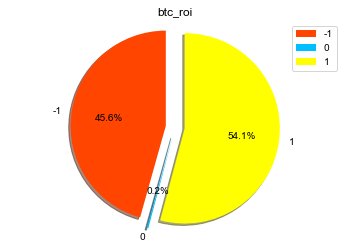

In [73]:
import matplotlib.pyplot as plt
import matplotlib

# matplotlib.rcParams['font.sans-serif'] = ['SimHei']
# matplotlib.rcParams['axes.unicode_minus'] = False

label_list = ["-1", "0", "1"]    # 各部分标签
size = [sum(data['roi_x']==-1),sum(data['roi_x']==0),sum(data['roi_x']==1)]    # 各部分大小
color = ["orangered", "deepskyblue", "yellow"]     # 各部分颜色
explode = [0.1, 0.1, 0.1]   # 各部分突出值

"""
绘制饼图
explode：设置各部分突出
label:设置各部分标签
labeldistance:设置标签文本距圆心位置，1.1表示1.1倍半径
autopct：设置圆里面文本
shadow：设置是否有阴影
startangle：起始角度，默认从0开始逆时针转
pctdistance：设置圆内文本距圆心距离
返回值
l_text：圆内部文本，matplotlib.text.Text object
p_text：圆外部文本
"""

patches, l_text, p_text = plt.pie(size, explode=explode, colors=color, labels=label_list, labeldistance=1.1, autopct="%1.1f%%", shadow=True, startangle=90, pctdistance=0.6)
plt.axis("equal")    # 设置横轴和纵轴大小相等，这样饼才是圆的
plt.title("btc_roi")
plt.legend()
plt.show()

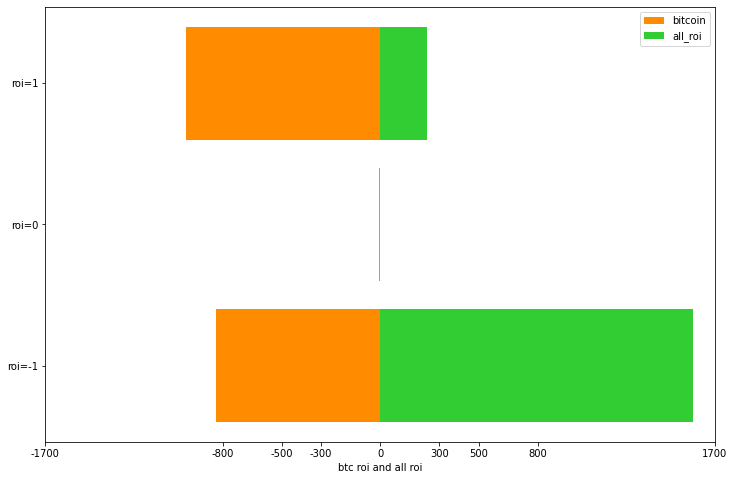

In [117]:
import numpy as np
import matplotlib.pyplot as plt
from pylab import *
mpl.rcParams['font.sans-serif'] = ['SimHei']

x = np.array([833,4,988])  #2015年
#x = np.array([600,566,659])  #2017年
y = np.array([1587,1,237])  #2017年

plt.figure(figsize=(12,8))
plt.barh(range(len(y)), -x,color='darkorange',label='bitcoin')
plt.barh(range(len(x)), y,color='limegreen',label='all_roi')


plt.xlim((-1700,1700))
plt.xticks((-1700,-800,-500,-300,0,300,500,800,1700),('-1700','-800','-500','-300','0','300','500','800','1700'))
plt.yticks((0, 1, 2),
           ('roi=-1','roi=0','roi=1'))
plt.xlabel('btc roi and all roi')

plt.legend()
plt.show()




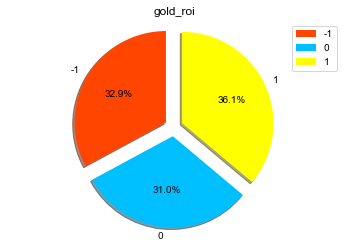

In [74]:
import matplotlib.pyplot as plt
import matplotlib

# matplotlib.rcParams['font.sans-serif'] = ['SimHei']
# matplotlib.rcParams['axes.unicode_minus'] = False

label_list = ["-1", "0", "1"]    # 各部分标签
size = [sum(data['roi_y']==-1),sum(data['roi_y']==0),sum(data['roi_y']==1)]    # 各部分大小
color = ["orangered", "deepskyblue", "yellow"]     # 各部分颜色
explode = [0.1, 0.1, 0.1]   # 各部分突出值

"""
绘制饼图
explode：设置各部分突出
label:设置各部分标签
labeldistance:设置标签文本距圆心位置，1.1表示1.1倍半径
autopct：设置圆里面文本
shadow：设置是否有阴影
startangle：起始角度，默认从0开始逆时针转
pctdistance：设置圆内文本距圆心距离
返回值
l_text：圆内部文本，matplotlib.text.Text object
p_text：圆外部文本
"""

patches, l_text, p_text = plt.pie(size, explode=explode, colors=color, labels=label_list, labeldistance=1.1, autopct="%1.1f%%", shadow=True, startangle=90, pctdistance=0.6)
plt.axis("equal")    # 设置横轴和纵轴大小相等，这样饼才是圆的
plt.title("gold_roi")
plt.legend()
plt.show()

In [12]:
del data['have_money']
del data['deal_bitcoin']
del data['deal_gold']
del data['have_bitcoin']
del data['have_gold']

In [79]:
data.to_csv('/Users/jiangshihua/Desktop/data.csv')

In [6]:
#%%
# 数据预览
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=data['USD (PM)'], name='Sales'))
fig.show()

In [39]:
#%%
# 数据预览
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=data['Value'], name='Value'))
fig.show()

In [13]:
feat_label1 = ['Value', 'roi_x', 'roi_Value_x', 'roi_Value_percent_x',
       'month_mean_Value_x', 'month_roi_x', 'USD (PM)', 'roi_y', 'roi_Value_y',
       'roi_Value_percent_y', 'month_mean_Value_y', 'month_roi_y', 'buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold']
feat_label2 = ['Value', 'USD (PM)',  'buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold']
feat_label5 = ['buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold']

feat_label3 = ['Date','Value', 'roi_x', 'roi_Value_x', 'roi_Value_percent_x',
       'month_mean_Value_x', 'month_roi_x', 'USD (PM)', 'roi_y', 'roi_Value_y',
       'roi_Value_percent_y', 'month_mean_Value_y', 'month_roi_y', 'buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold', 'have_money', 'deal_bitcoin', 'deal_gold',
       'have_bitcoin', 'have_gold']
feat_label4 = ['Date','Value', 'USD (PM)',  'buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold', 'have_money', 'deal_bitcoin', 'deal_gold',
       'have_bitcoin', 'have_gold']
feat_label6 = ['Date','buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold']

target_label = ['have_money', 'deal_bitcoin', 'deal_gold',
       'have_bitcoin', 'have_gold']

In [13]:
from sklearn import preprocessing
temp = data.columns
normalizer = preprocessing.Normalizer().fit(data[feat_label1])
data_normalizer = pd.DataFrame(normalizer.transform(data[feat_label1]))
new_data = pd.concat([data.iloc[:,:1],data_normalizer],axis=1)
data = pd.concat([new_data,data.iloc[:,-5:]],axis=1)
data.columns = temp

In [14]:
temp1 = ['Date','buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold','have_money', 'deal_bitcoin', 'deal_gold',
       'have_bitcoin', 'have_gold']
data.columns = temp1

ValueError: Length mismatch: Expected axis has 24 elements, new values have 12 elements

In [14]:
# BCHAIN_MKPRU = BCHAIN_MKPRU.set_index('Date')
# LBMA_GOLD = LBMA_GOLD.set_index('Date')
data = data.set_index('Date')

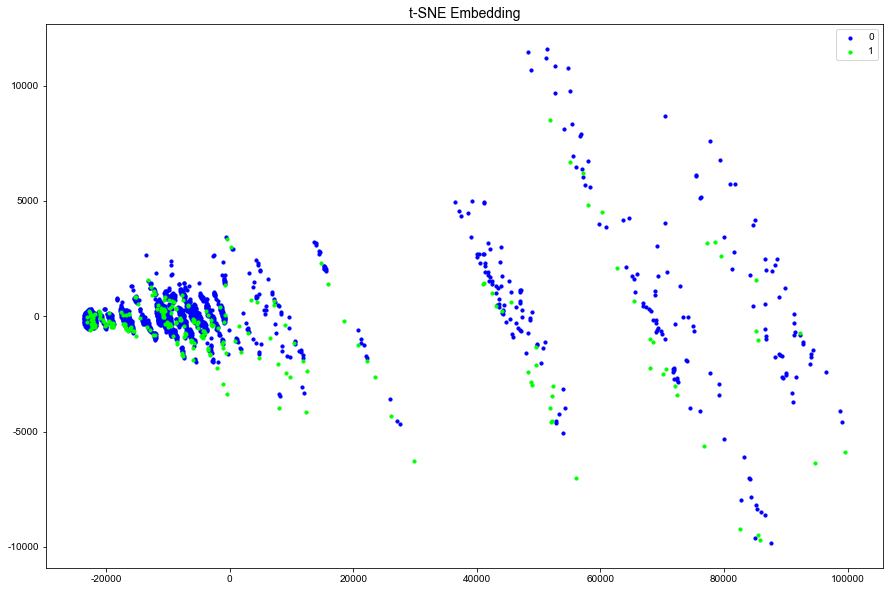

In [87]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

data['earn_money'] = None
earn_money_list = []
for i in range(len(data)):
    if data['new_roi_bitcoin'][i] > 0 or data['new_roi_gold'][i] >0:
        earn_money_list.append(1)
    else:
        earn_money_list.append(0)
data.iloc[:,-1:] = earn_money_list
# 训练函数
def Train(data):
    #data, label, n_samples, n_features = GetData(qc_data,qc_data_label_Tju)
    tsne = TSNE(n_components=2, init='pca', random_state=0)
    result = tsne.fit_transform(data)
    return result

def PlotEmbedding(data, label, n_samples):
#     x_min, x_max = np.min(data, 0), np.max(data, 0)
#     data = (data - x_min) / (x_max - x_min)
    fig = plt.figure(figsize=(15, 10))
    ax = plt.subplot(111)
    
    colors = list()
    color_list = np.random.randint(100, size=2).tolist()
    for i in range(0, len(label)):
        colors.append(color_list[label[i]])
#     print(colors)
    
    type1_x = list()
    type1_y = list()
    type2_x = list()
    type2_y = list()

    
    for i in range(len(label)):
        if label[i] == 0:
            type1_x.append(data[i, 0])
            type1_y.append(data[i, 1])
        if label[i] == 1:
            type2_x.append(data[i, 0])
            type2_y.append(data[i, 1])
     
    
    type1 = ax.scatter(type1_x, type1_y, c='#0000FF', marker='o', s=10)
    type2 = ax.scatter(type2_x, type2_y, c='#00FF00', marker='o', s=10)
 

    
    ax.legend((type1, type2), ('0','1'), loc="upper right")
    
#     scatter = ax.scatter(data[:, 0], data[:, 1], c=colors, marker='o', s=10)
#     # 按照散点图中标记的colors生成legend
#     legendClass = ax.legend(*scatter.legend_elements(), loc="upper right", title="classes", ncol=4)
#     ax.add_artist(legendClass)
    
#     for i in range(n_samples):
#         plt.text(data[i, 0], data[i, 1], str(label[i]), color=plt.cm.Set1(label[i] / 10), fontdict={'weight': 'bold', 'size': 7})
    
    plt.xticks()
    plt.yticks()
    plt.title("t-SNE Embedding", fontsize=14)
    return fig

data_array = np.array(data[feat_label1])
data_list = data_array.tolist()
label_array = np.array(data['earn_money'])
label_list = label_array.tolist()
data_1, label, n_samples, n_features = data_list, label_list, data.shape, data.shape
    
result = Train(data_1)
fig = PlotEmbedding(result, label_list, n_samples)

plt.show()

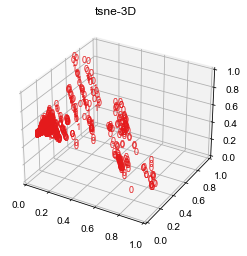

In [95]:
def plot_embedding_3d(X, title=None):
    #坐标缩放到[0,1]区间
    x_min, x_max = np.min(X,axis=0), np.max(X,axis=0)
    X = (X - x_min) / (x_max - x_min)
    #降维后的坐标为（X[i, 0], X[i, 1],X[i,2]），在该位置画出对应的digits
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    color1 = plt.cm.Set1(1)
    color2 = plt.cm.Set2(1)
    color_list = [color1,color2]
    for i in range(X.shape[0]):
        ax.text(X[i, 0], X[i, 1], X[i,2],str(label_list[i]),
                 color=plt.cm.Set1(y[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})
    if title is not None:
        plt.title(title)
y = label
tsne3d = TSNE(n_components=3, init='pca', random_state=0)
X_tsne_3d = tsne3d.fit_transform(data.iloc[:,1:-6])
plot_embedding_3d(X_tsne_3d, 'tsne-3D')

In [15]:
data_1 = data[feat_label1]
data_2 = data[target_label]
data = pd.concat([data_1,data_2],axis=1)
#data = data.set_index('Date')

In [17]:
#%%
def create_dataset(data:list, time_step: int):
    arr_x, arr_y = [], []
    for i in range(len(data) - time_step - 1):
        x = data[i: i + time_step]
        y = data[i + time_step]
        arr_x.append(x)
        arr_y.append(y)
    return np.array(arr_x), np.array(arr_y)

time_step = 18
X, Y = create_dataset(data.values, time_step)

In [18]:
# 转化成 tensor->(seq_size, batch_size, feature_size)
X = torch.tensor(X.reshape(-1, 1, time_step)).float()
Y = torch.tensor(Y.reshape(-1, 1, 1)).float()
print('Total datasets: ',X.shape, '-->', Y.shape)
# 划分数据
split_ratio=0.8
len_train = int(len(X)*split_ratio)
X_train, Y_train = X[:len_train,:,:], Y[:len_train,:,:]
print('Train datasets: ',X_train.shape, '-->', Y_train.shape)

Total datasets:  torch.Size([41538, 1, 18]) --> torch.Size([41538, 1, 1])
Train datasets:  torch.Size([33230, 1, 18]) --> torch.Size([33230, 1, 1])


In [19]:
# 构建迭代器
batch_size = 256
ds = TensorDataset(X, Y)
dl = DataLoader(ds, batch_size=batch_size, num_workers=4)
ds_train = TensorDataset(X_train, Y_train)
dl_train = DataLoader(ds_train, batch_size=batch_size, num_workers=4)

In [20]:
#%%
# 定义模型
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.lstm = nn.LSTM(input_size=time_step, hidden_size=6, num_layers=2,bidirectional=True)
        self.fc = nn.Linear(in_features=12, out_features=1)

    def forward(self, x):
        # x is input, size (seq_len, batch, input_size)
        x, _ = self.lstm(x)
        # x is output, size (seq_len, batch, hidden_size)
        s, b, h = x.shape
        x = x.view(s * b, h)
        x = self.fc(x)
        x = x.view(s, b, -1)
        return x

In [21]:
#%%
# torchkeras API 训练方式
model = torchkeras.Model(Net())
model.summary(input_shape=(1, time_step))
model.compile(loss_func=F.mse_loss, optimizer=torch.optim.Adam(model.parameters(), lr=0.01))
dfhistory = model.fit(epochs=20, dl_train=dl_train, log_step_freq=20)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
              LSTM-1                [-1, 1, 12]           2,208
            Linear-2                    [-1, 1]              13
Total params: 2,221
Trainable params: 2,221
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.000069
Forward/backward pass size (MB): 0.000099
Params size (MB): 0.008472
Estimated Total Size (MB): 0.008640
----------------------------------------------------------------
Start Training ...

================================================================================2022-02-22 03:37:48
{'step': 20, 'loss': 139591.068}
{'step': 40, 'loss': 1565712.455}
{'step': 60, 'loss': 61656869.67}
{'step': 80, 'loss': 165797875.853}
{'step': 100, 'loss': 9586293668.362}
{'step': 120, 'loss': 1959733469756.168}

 +-------+--------------------+
| epoch |        loss        |
+-------+-----

{'step': 20, 'loss': 137783.73}
{'step': 40, 'loss': 1545811.752}
{'step': 60, 'loss': 61484868.835}
{'step': 80, 'loss': 165454955.226}
{'step': 100, 'loss': 9584986340.501}
{'step': 120, 'loss': 1959721592612.817}

 +-------+--------------------+
| epoch |        loss        |
+-------+--------------------+
|   17  | 17923057538901.184 |
+-------+--------------------+

================================================================================2022-02-22 03:45:12
{'step': 20, 'loss': 138264.807}
{'step': 40, 'loss': 1545381.273}
{'step': 60, 'loss': 61476532.882}
{'step': 80, 'loss': 165437294.062}
{'step': 100, 'loss': 9584913003.889}
{'step': 120, 'loss': 1959720991304.841}

 +-------+--------------------+
| epoch |        loss        |
+-------+--------------------+
|   18  | 17923053370293.453 |
+-------+--------------------+

================================================================================2022-02-22 03:45:36
{'step': 20, 'loss': 138695.478}
{'step': 40, 'loss

In [22]:
#%%
# 模型评估
fig = go.Figure()
fig.add_trace(go.Scatter(x=dfhistory.index, y=dfhistory['loss'], name='loss'))
fig.show()

In [23]:
#%%
# 预测验证预览
y_pred = model.predict(dl)
y_pred = y_pred.detach().numpy()

fig = go.Figure()
fig.add_trace(go.Scatter(y=Y.squeeze(), name='y_true'))
fig.add_trace(go.Scatter(y=y_pred.squeeze(), name='y_pred'))
fig.show()

In [35]:
print(data.loc[['2021-09-09'], feat_label1])

               Value     roi_x  roi_Value_x  roi_Value_percent_x  \
Date                                                               
2021-09-09  0.491673 -0.000011    -0.007798            -0.000017   

            month_mean_Value_x  month_roi_x  USD (PM)     roi_y  roi_Value_y  \
Date                                                                           
2021-09-09            0.521816    -0.000011  0.019081  0.000011     0.000024   

            roi_Value_percent_y  month_mean_Value_y  month_roi_y  buy_Value  \
Date                                                                          
2021-09-09             0.000001            0.019261    -0.000011   0.501507   

            sale_Value  buy_USD (PM)  sale_USD (PM)  new_roi_bitcoin  \
Date                                                                   
2021-09-09     0.48184      0.019272        0.01889        -0.027621   

            new_roi_gold  
Date                      
2021-09-09     -0.000357  


In [39]:
X_1, Y_1 = create_dataset(data.loc[['2021-09-09'], feat_label1], time_step)
ds = TensorDataset(X, Y)
dl = DataLoader(ds, batch_size=batch_size, num_workers=4)
y_pred = model.predict(dl)
y_pred = y_pred.detach().numpy()
y_pred

array([[[ 178.21991 ]],

       [[  76.652145]],

       [[  76.84036 ]],

       ...,

       [[ 249.71866 ]],

       [[1208.5475  ]],

       [[ 701.396   ]]], dtype=float32)

In [16]:
data1=data.corr()
BCHAIN_MKPRU1=BCHAIN_MKPRU.corr()
LBMA_GOLD1=LBMA_GOLD.corr()

<AxesSubplot:>

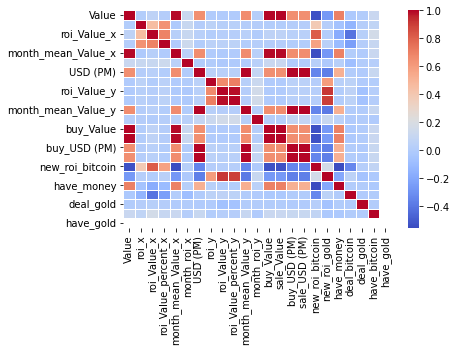

In [17]:
import seaborn as sns
sns.heatmap(data1,cmap="coolwarm",annot=False,fmt=".2f",linewidth=0.5)

<AxesSubplot:>

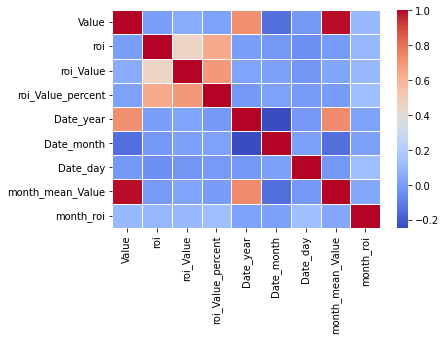

In [18]:
sns.heatmap(BCHAIN_MKPRU1,cmap="coolwarm",annot=False,fmt=".2f",linewidth=0.5)

<AxesSubplot:>

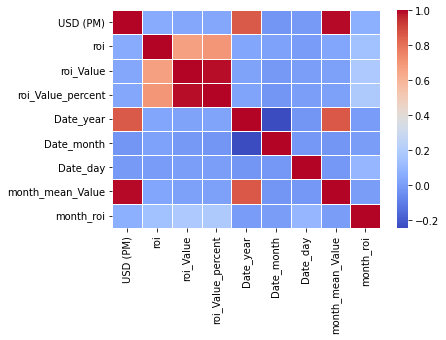

In [19]:
sns.heatmap(LBMA_GOLD1,cmap="coolwarm",annot=False,fmt=".2f",linewidth=0.5)

Text(0.5, 0, 'time')

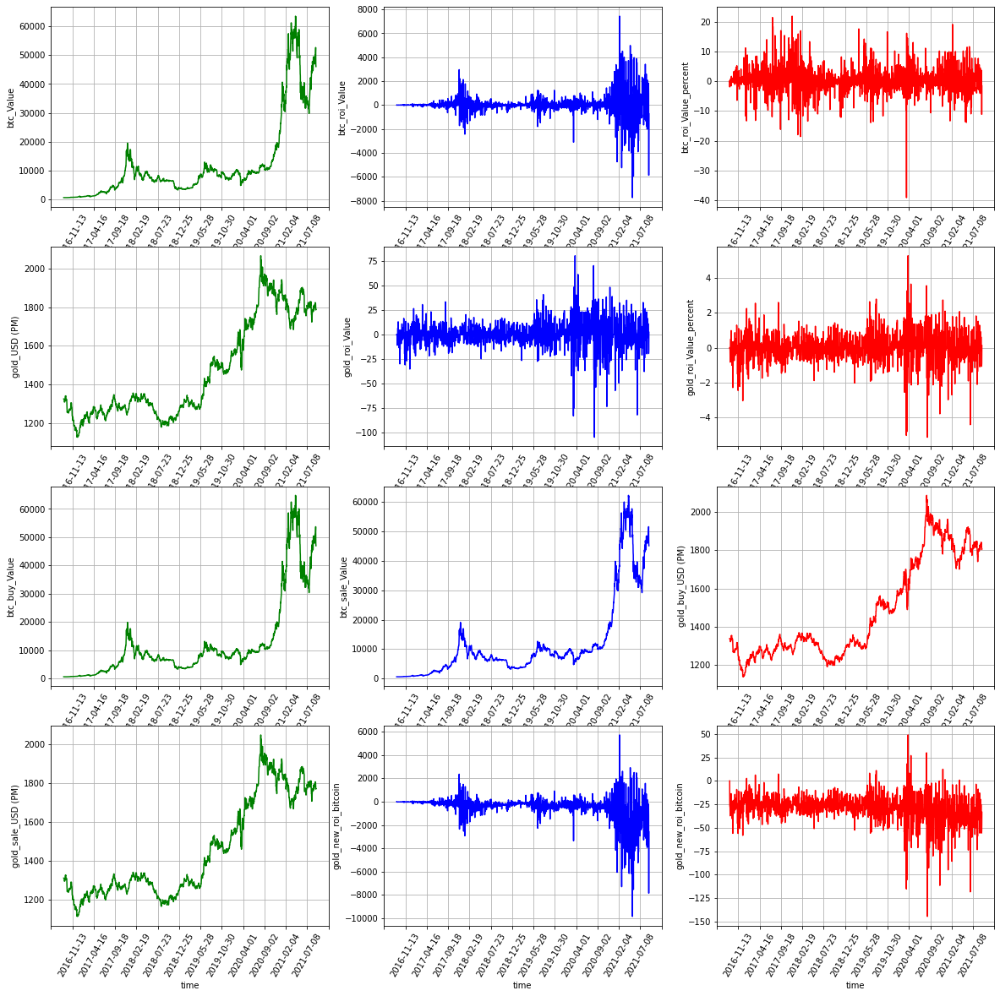

In [75]:
from matplotlib import pyplot as plt
import matplotlib as mpl
%matplotlib inline
fig, axes = plt.subplots(4, 3, figsize=(20, 20))
### 代码开始 ### (≈ 9 行代码)
axes[0][0].plot(data.index,data['Value'], color='green')
axes[0][0].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[0][0].xaxis.set_major_locator(xlocator)
for tick in axes[0][0].get_xticklabels():
    tick.set_rotation(60)
axes[0][0].set_ylabel('btc_Value')
axes[0][0].set_xlabel('time')

axes[0][1].plot(data.index,data['roi_Value_x'], color='blue')
axes[0][1].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[0][1].xaxis.set_major_locator(xlocator)
for tick in axes[0][1].get_xticklabels():
    tick.set_rotation(60)
axes[0][1].set_ylabel('btc_roi_Value')
axes[0][1].set_xlabel('time')

axes[0][2].plot(data.index,data['roi_Value_percent_x'], color='red')
axes[0][2].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[0][2].xaxis.set_major_locator(xlocator)
for tick in axes[0][2].get_xticklabels():
    tick.set_rotation(60)
axes[0][2].set_ylabel('btc_roi_Value_percent')
axes[0][2].set_xlabel('time')

axes[1][0].plot(data.index,data['USD (PM)'], color='green')
axes[1][0].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[1][0].xaxis.set_major_locator(xlocator)
for tick in axes[1][0].get_xticklabels():
    tick.set_rotation(60)
axes[1][0].set_ylabel('gold_USD (PM)')
axes[1][0].set_xlabel('time')

axes[1][1].plot(data.index,data['roi_Value_y'], color='blue')
axes[1][1].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[1][1].xaxis.set_major_locator(xlocator)
for tick in axes[1][1].get_xticklabels():
    tick.set_rotation(60)
axes[1][1].set_ylabel('gold_roi_Value')
axes[1][1].set_xlabel('time')

axes[1][2].plot(data.index,data['roi_Value_percent_y'], color='red')
axes[1][2].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[1][2].xaxis.set_major_locator(xlocator)
for tick in axes[1][2].get_xticklabels():
    tick.set_rotation(60)
axes[1][2].set_ylabel('gold_roi_Value_percent')
axes[1][2].set_xlabel('time')

############
axes[2][0].plot(data.index,data['buy_Value'], color='green')
axes[2][0].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[2][0].xaxis.set_major_locator(xlocator)
for tick in axes[2][0].get_xticklabels():
    tick.set_rotation(60)
axes[2][0].set_ylabel('btc_buy_Value')
axes[2][0].set_xlabel('time')

axes[2][1].plot(data.index,data['sale_Value'], color='blue')
axes[2][1].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[2][1].xaxis.set_major_locator(xlocator)
for tick in axes[2][1].get_xticklabels():
    tick.set_rotation(60)
axes[2][1].set_ylabel('btc_sale_Value')
axes[2][1].set_xlabel('time')

axes[2][2].plot(data.index,data['buy_USD (PM)'], color='red')
axes[2][2].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[2][2].xaxis.set_major_locator(xlocator)
for tick in axes[2][2].get_xticklabels():
    tick.set_rotation(60)
axes[2][2].set_ylabel('gold_buy_USD (PM)')
axes[2][2].set_xlabel('time')

axes[3][0].plot(data.index,data['sale_USD (PM)'], color='green')
axes[3][0].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[3][0].xaxis.set_major_locator(xlocator)
for tick in axes[3][0].get_xticklabels():
    tick.set_rotation(60)
axes[3][0].set_ylabel('gold_sale_USD (PM)')
axes[3][0].set_xlabel('time')

axes[3][1].plot(data.index,data['new_roi_bitcoin'], color='blue')
axes[3][1].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[3][1].xaxis.set_major_locator(xlocator)
for tick in axes[3][1].get_xticklabels():
    tick.set_rotation(60)
axes[3][1].set_ylabel('gold_new_roi_bitcoin')
axes[3][1].set_xlabel('time')

axes[3][2].plot(data.index,data['new_roi_gold'], color='red')
axes[3][2].grid()
# # 设置多少标签
xlocator= mpl.ticker.LinearLocator(14)
axes[3][2].xaxis.set_major_locator(xlocator)
for tick in axes[3][2].get_xticklabels():
    tick.set_rotation(60)
axes[3][2].set_ylabel('gold_new_roi_bitcoin')
axes[3][2].set_xlabel('time')

In [63]:
data

,Value,roi_x,roi_Value_x,roi_Value_percent_x,month_mean_Value_x,month_roi_x,USD (PM),roi_y,roi_Value_y,roi_Value_percent_y,...,sale_Value,buy_USD (PM),sale_USD (PM),new_roi_bitcoin,new_roi_gold,have_money,deal_bitcoin,deal_gold,have_bitcoin,have_gold
Date,,,,,,,,,,,,,,,,,,,,,
2016-09-11,621.65,0.0,0.00,0.000000,606.3935,1,1324.60,0.0,0.00,0.000000,...,609.2170,1337.8460,1311.3540,0.0000,0.0000,1.000000e+03,0.0,0.0,0.0,0
2016-09-12,609.67,-1.0,-11.98,-1.927129,606.3935,1,1324.60,0.0,0.00,0.000000,...,597.4766,1337.8460,1311.3540,-36.6064,-26.4920,1.000000e+03,0.0,0.0,0.0,0
2016-09-13,610.92,1.0,1.25,0.205029,606.3935,1,1323.65,-1.0,-0.95,-0.071720,...,598.7016,1336.8865,1310.4135,-23.1618,-27.4325,1.000000e+03,0.0,0.0,0.0,0
2016-09-14,608.82,-1.0,-2.10,-0.343744,606.3935,1,1321.75,-1.0,-1.90,-0.143542,...,596.6436,1334.9675,1308.5325,-26.4948,-28.3540,1.000000e+03,0.0,0.0,0.0,0
2016-09-15,610.38,1.0,1.56,0.256233,606.3935,1,1310.80,-1.0,-10.95,-0.828447,...,598.1724,1323.9080,1297.6920,-22.8240,-37.2755,1.000000e+03,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-05,49947.38,-1.0,-87.95,-0.175776,48903.3050,1,1823.70,0.0,0.00,0.000000,...,48948.4324,1841.9370,1805.4630,-2087.6042,-36.4740,7.369634e+08,0.0,0.0,0.0,0
2021-09-06,51769.06,1.0,1821.68,3.647198,48903.3050,1,1821.60,-1.0,-2.10,-0.115151,...,50733.6788,1839.8160,1803.3840,-212.6488,-38.5530,7.369634e+08,0.0,0.0,0.0,0
2021-09-07,52677.40,1.0,908.34,1.754600,48903.3050,1,1802.15,-1.0,-19.45,-1.067743,...,51623.8520,1820.1715,1784.1285,-1180.5892,-55.6875,7.369634e+08,0.0,0.0,0.0,0


/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_63757/1400083628.py:11: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



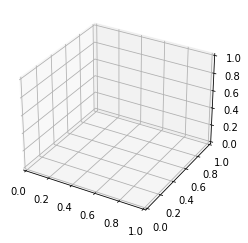

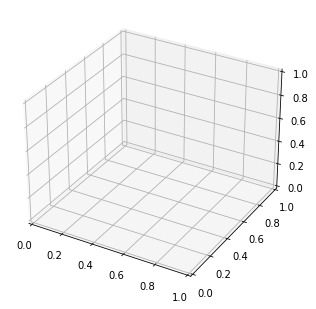

In [25]:
#方法一，利用关键字
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import pyplot as plt
#定义坐标轴
fig = plt.figure()
ax1 = plt.axes(projection='3d')
#ax = fig.add_subplot(111,projection='3d')  #这种方法也可以画多个子图

#定义图像和三维格式坐标轴
fig=plt.figure()
ax2 = Axes3D(fig)

fig = plt.figure()  #定义新的三维坐标轴
ax3 = plt.axes(projection='3d')

#定义三维数据
X, Y = np.meshgrid(Y, y_pred)
Z = np.sin(X)+np.cos(Y)


#作图
ax3.plot_surface(X,Y,Z,cmap='rainbow')
#ax3.contour(X,Y,Z, zdim='z',offset=-2，cmap='rainbow)   #等高线图，要设置offset，为Z的最小值
plt.show()

In [ ]:
## %%
# 自定义训练方式
model = Net()
loss_function = nn.L1Loss()
optimizer = torch.optim.SGD(model.parameters(), lr=1e-2)

def train_step(model,features, labels):
    # 正向传播求损失
    predictions = model.forward(features)
    loss = loss_function(predictions, labels)
    # 反向传播求梯度
    loss.backward()
    # 参数更新
    optimizer.step()
    optimizer.zero_grad()
    return loss.item()


# 测试一个batch
# loss_list = []
# for i in range(batch_size):
features, labels = next(iter(dl_train))
loss =  train_step(model, features, labels)
loss
#     loss_list.append(loss)
#print(loss_list)

In [19]:
#%%
# 训练模型
def train_model(model, epochs):
    for epoch  in range(1, epochs+1):
        list_loss = []
        for features, labels in dl_train:
            lossi = train_step(model,features, labels)
            list_loss.append(lossi)
        loss = np.mean(list_loss)
        if epoch % 10 == 0:
            print('epoch={} | loss={} '.format(epoch,loss))

train_model(model, 100)

epoch=10 | loss=119.6723349808719 
epoch=20 | loss=116.6036795994651 
epoch=30 | loss=110.8785461059031 
epoch=40 | loss=104.75032993358705 
epoch=50 | loss=98.83571210584752 
epoch=60 | loss=93.33067574018634 
epoch=70 | loss=88.16250996861785 
epoch=80 | loss=83.31398436206788 
epoch=90 | loss=78.81009813938314 
epoch=100 | loss=74.80772766869046 


In [20]:
#%%
# 预测验证预览
y_pred = model.forward(X)
y_pred = y_pred.detach().numpy()

fig = go.Figure()
fig.add_trace(go.Scatter(y=Y.squeeze(), name='y_true'))
fig.add_trace(go.Scatter(y=y_pred.squeeze(), name='y_pred'))
fig.show()

### SVR

In [15]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))
new_data = scaler.fit_transform(data.iloc[:,:-5])
#inverse_data = scaler.inverse_transform(trans_data)

In [16]:
data_label =['Value', 'roi_x', 'roi_Value_x', 'roi_Value_percent_x',
       'month_mean_Value_x', 'month_roi_x', 'USD (PM)', 'roi_y', 'roi_Value_y',
       'roi_Value_percent_y', 'month_mean_Value_y', 'month_roi_y', 'buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold']

In [17]:
new_data = pd.DataFrame(new_data)
new_data.columns = ['Value', 'roi_x', 'roi_Value_x', 'roi_Value_percent_x',
       'month_mean_Value_x', 'month_roi_x', 'USD (PM)', 'roi_y', 'roi_Value_y',
       'roi_Value_percent_y', 'month_mean_Value_y', 'month_roi_y', 'buy_Value',
       'sale_Value', 'buy_USD (PM)', 'sale_USD (PM)', 'new_roi_bitcoin',
       'new_roi_gold']

In [18]:
data.index = range(1825)

In [19]:
data = pd.concat([new_data,data.iloc[:,-5:]],axis=1)

In [73]:
#4、划分数据集
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(data[data_label], data['have_bitcoin'], test_size=0.3,random_state=22)

MSE train: 40.518, test: 35.503
R^2 train: 0.059, test: 0.105


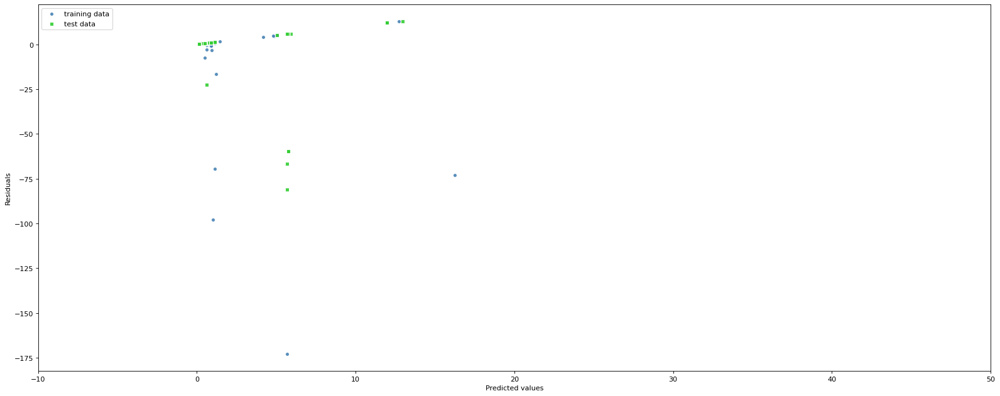

In [78]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

plt.figure(figsize=(20, 8), dpi=80)
# criterion ：
# 回归树衡量分枝质量的指标，支持的标准有三种：
# 1）输入"mse"使用均方误差mean squared error(MSE)，父节点和叶子节点之间的均方误差的差额将被用来作为特征选择的标准，
# 这种方法通过使用叶子节点的均值来最小化L2损失
# 2）输入“friedman_mse”使用费尔德曼均方误差，这种指标使用弗里德曼针对潜在分枝中的问题改进后的均方误差
# 3）输入"mae"使用绝对平均误差MAE（mean absolute error），这种指标使用叶节点的中值来最小化L1损失
# forest = RandomForestRegressor(n_estimators=1000,
#                                criterion='mse',
#                                random_state=1,
#                                n_jobs=-1,
#                                max_depth=1,
#                               max_leaf_nodes = 600)

forest = RandomForestRegressor(n_estimators=500,
                               criterion='mse',
                               random_state=1,
                               n_jobs=-1,
                               max_depth=1,
                              max_leaf_nodes = 300)
forest.fit(X_train, y_train)
y_train_pred = forest.predict(X_train)
y_test_pred = forest.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

# 绘制残差图
# 残差分布似乎并不是围绕零中心点完全随机，这表明该模型不能捕捉所有的探索性信息
plt.scatter(y_train_pred,
            y_train_pred - y_train,
            c='steelblue',
            edgecolor='white',
            marker='o',
            s=30,
            alpha=0.9,
            label='training data')
plt.scatter(y_test_pred,
            y_test_pred - y_test,
            c='limegreen',
            edgecolor='white',
            marker='s',
            s=30,
            alpha=0.9,
            label='test data')

plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend(loc='upper left')
#plt.hlines(y=0, xmin=-10, xmax=50, lw=2, color='black')
plt.xlim([-10, 50])
plt.tight_layout()

# plt.savefig('images/10_14.png', dpi=300)
plt.show()



In [74]:
x_test, x_train = X_test,X_train

In [75]:
from sklearn.ensemble import RandomForestRegressor
#4）预估器
estimator=RandomForestRegressor()#n_estimators=800,max_depth=1,max_leaf_nodes=251)#kernel=('linear'，'poly'，'rbf'，'sigmoid')
estimator.fit(x_train,y_train)

RandomForestRegressor()

In [76]:
from sklearn.model_selection import GridSearchCV
#加入网格搜索与交叉验证
#参数准备
param_dict={"max_leaf_nodes":[100,300,500],"n_estimators":[500,800,1000],"n_estimators":[300,500,800,1000],"max_depth":[1,3,5]}
estimator=GridSearchCV(estimator,param_grid=param_dict,cv=3)
estimator.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [1, 3, 5],
                         'max_leaf_nodes': [100, 300, 500],
                         'n_estimators': [300, 500, 800, 1000]})

In [77]:
#5）模型评估
#1
y_predict=estimator.predict(x_test)
print("y_predict:\n",y_predict)
#2
score=estimator.score(x_test,y_test)
print("最佳参数：\n",estimator.best_params_)
print("最佳结果：\n",estimator.best_score_)
print("最佳估计器：\n",estimator.best_estimator_)
print("交叉验证结果：\n",estimator.cv_results_)
# 方法2：计算准确率
score = estimator.score(x_test, y_test)
print("准确率为：\n", score)

y_predict:
 [ 0.12588141  0.12588141  0.12588141  0.12588141  0.12588141  0.12588141
  0.12588141  0.18824412  1.17341618  0.12588141  0.12588141  0.12588141
  0.12588141  0.12588141  0.12588141  0.12588141  0.12588141  0.12588141
  0.1969279   0.12588141  0.12588141  0.12588141  0.12588141  0.12588141
  0.12588141  0.12588141  0.12588141  0.12588141  0.12588141  0.12588141
  0.12588141  0.64235797  0.64260166  0.12588141  0.12588141  0.12588141
  0.12588141  0.12588141  1.17341618  0.12588141  0.12588141  0.55641487
  0.12588141  5.45292839  0.12588141  0.12588141  0.12588141  0.12588141
  0.12588141  0.12588141  5.45292839  0.12588141  0.12588141  0.12588141
  0.12588141  0.18824412  0.1969279   0.55641487  0.12588141  0.12588141
  0.12588141  0.12588141  0.12588141  0.12588141  0.12588141  0.12588141
  0.1969279   0.12588141  0.12588141  0.12588141  0.12588141  0.12588141
  0.18824412  0.12588141  0.12588141  0.12588141  0.12588141  0.63815274
  0.81358255  0.12588141  0.12588141  0

In [79]:
y_predict = y_test_pred

In [80]:
#R2_score,与均值的比较
from sklearn.metrics import r2_score
r2 = r2_score(y_test,y_predict)

In [81]:
# MSE, MAE, RMSE
from sklearn.metrics import mean_squared_error #MSE
from sklearn.metrics import mean_absolute_error #MAE
#MSE均方误差
mse_ = mean_squared_error(y_test,y_predict)

In [82]:
#MAE平均绝对误差
mae_ = mean_absolute_error(y_test,y_predict)

In [83]:
print("r2:",r2)
print("mse_:",mse_)
print("mae_:",mae_)

r2: 0.10517474191565146
mse_: 35.50337173053536
mae_: 0.8722536192596594


In [84]:
aaa = scaler.inverse_transform(data.iloc[-1:,:-5].values)
aaa

array([[ 4.60783800e+04, -1.00000000e+00, -7.30790000e+02,
        -1.56121119e+00,  4.89033050e+04, -1.00000000e+00,
         1.78825000e+03,  1.00000000e+00,  2.25000000e+00,
         1.25979843e-01,  1.80508125e+03, -1.00000000e+00,
         4.71381827e+04,  4.50185773e+04,  1.81149725e+03,
         1.76500275e+03, -2.86720365e+03, -4.42152500e+01]])

In [85]:
aaa = forest.predict(aaa)
aaa

array([11.87065046])

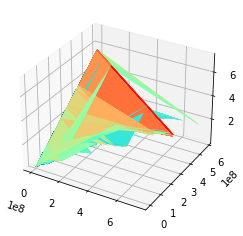

In [37]:
fig = plt.figure()  #定义新的三维坐标轴
ax3 = plt.axes(projection='3d')

#定义三维数据
xx = y_test
yy = y_predict
X, Y = np.meshgrid(xx, yy)
Z = np.abs(X-Y)


#作图
ax3.plot_surface(X,Y,Z,cmap='rainbow')
#ax3.contour(X,Y,Z, zdim='z',offset=-2，cmap='rainbow)   #等高线图，要设置offset，为Z的最小值
plt.show()



In [46]:
aaa = [46368.69,1,290.31,0.630035171,48903.305,-1,1794.6,1,6.35,0.355095764,1805.08125,-1,47296.0638,45441.3162,1812.546,1776.654,-1558.6314,-29.4785]

/var/folders/b9/cbcfk7cn21jgh4rpfnygpcmh0000gn/T/ipykernel_68088/2258545025.py:11: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



ValueError: Argument Z must be 2-dimensional.

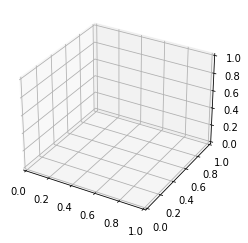

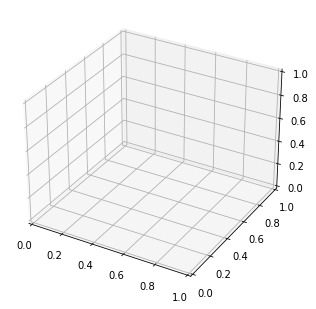

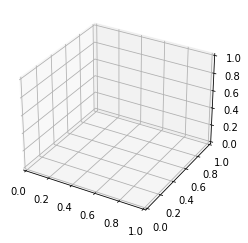

In [133]:
#方法一，利用关键字
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import pyplot as plt
#定义坐标轴
fig = plt.figure()
ax1 = plt.axes(projection='3d')
#ax = fig.add_subplot(111,projection='3d')  #这种方法也可以画多个子图

#定义图像和三维格式坐标轴
fig=plt.figure()
ax2 = Axes3D(fig)

fig = plt.figure()  #定义新的三维坐标轴
ax3 = plt.axes(projection='3d')

#定义三维数据
X, Y = np.meshgrid(y_test, y_train_pred)
Z = r2


#作图
ax3.plot_surface(X,Y,Z,cmap='rainbow')
#ax3.contour(X,Y,Z, zdim='z',offset=-2，cmap='rainbow)   #等高线图，要设置offset，为Z的最小值
plt.show()

In [19]:
from sklearn import ensemble
import matplotlib.pyplot as plt
random_forest_regressor = ensemble.RandomForestRegressor(n_estimators=20)  # 随机森林回归,并使用20个决策树
random_forest_regressor.fit(x_train, y_train)  # 拟合模型
score = random_forest_regressor.score(x_test, y_test)
result = random_forest_regressor.predict(x_test)
plt.figure()
plt.plot(np.arange(len(result)), y_test, "go-", label="True value")
plt.plot(np.arange(len(result)), result, "ro-", label="Predict value")
plt.title(f"RandomForest---score:{score}")
plt.legend(loc="best")
plt.show()

ValueError: at least one array or dtype is required